In [157]:
from __future__ import absolute_import, division, print_function, unicode_literals

In [158]:
try:
  !pip install tensorflow_datasets
  !pip install scikit-learn
  !pip install urllib3
  !pip install Pillow
  !pip install tensorflow
except Exception:
  pass

In [159]:
import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE
import IPython.display as display
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import zipfile
import pathlib

In [160]:
tf.__version__

'2.1.0'

# Data preprocessing

In [161]:
dataset_name = "DDC Prison BLM TUA"

# if not os.path.exists('Dataset'):
#     os.mkdir('Dataset')
    
# with zipfile.ZipFile(dataset_name + ".zip","r") as zip_ref:
#     zip_ref.extractall("Dataset")

In [162]:
data_dir = pathlib.Path("Dataset/" + dataset_name)
data_dir

WindowsPath('Dataset/DDC Prison BLM TUA')

In [163]:
image_count = len(list(data_dir.glob('*/*.jpg')))
image_count

2135

In [164]:
CLASS_NAMES = np.array([item.name for item in data_dir.glob('*') if item.name != ".DS_Store"])
CLASS_NAMES

array(['AB', 'N'], dtype='<U2')

In [165]:
normal = list(data_dir.glob('N/*'))

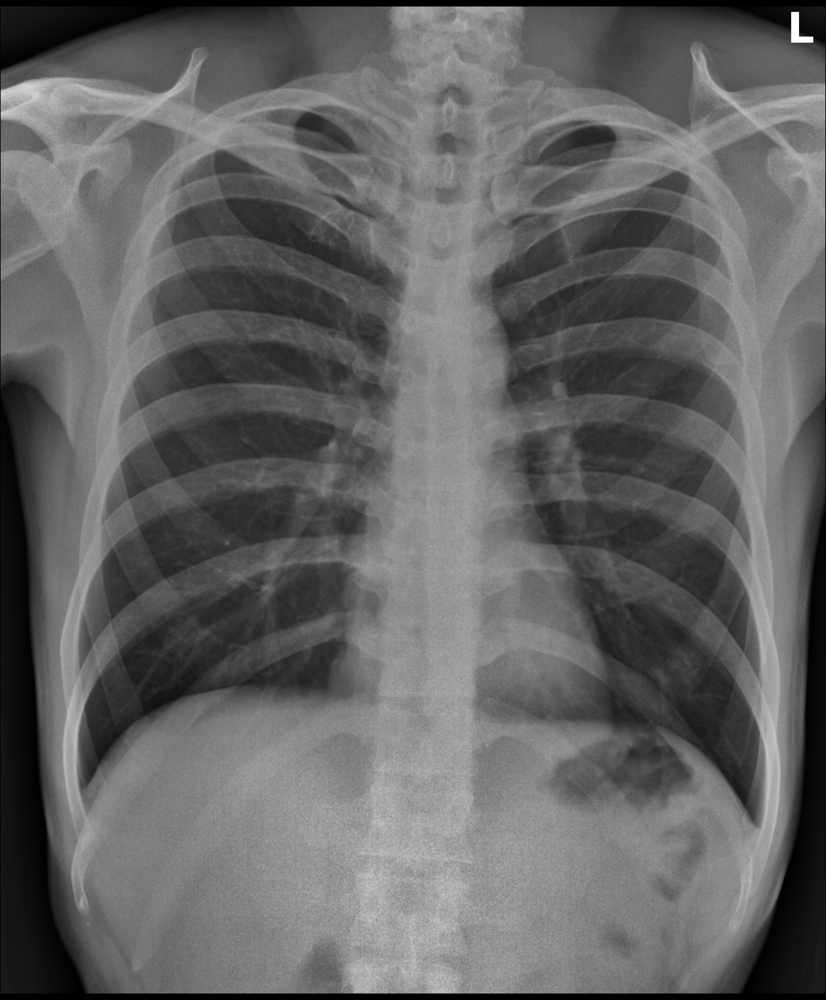

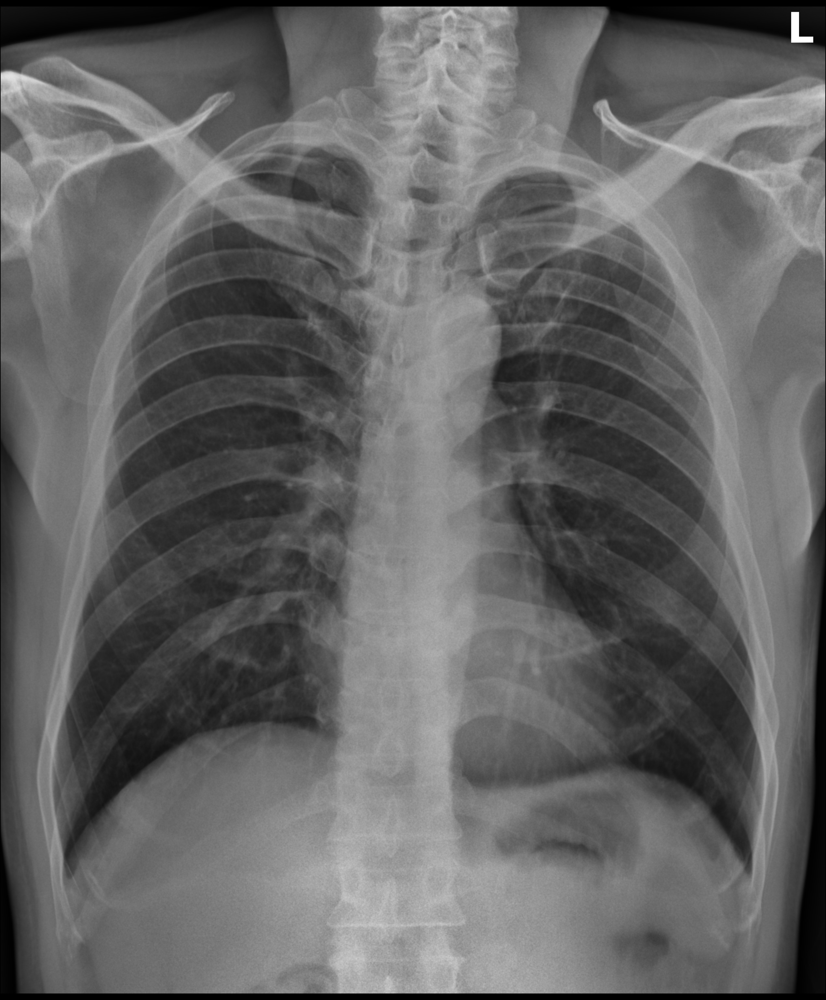

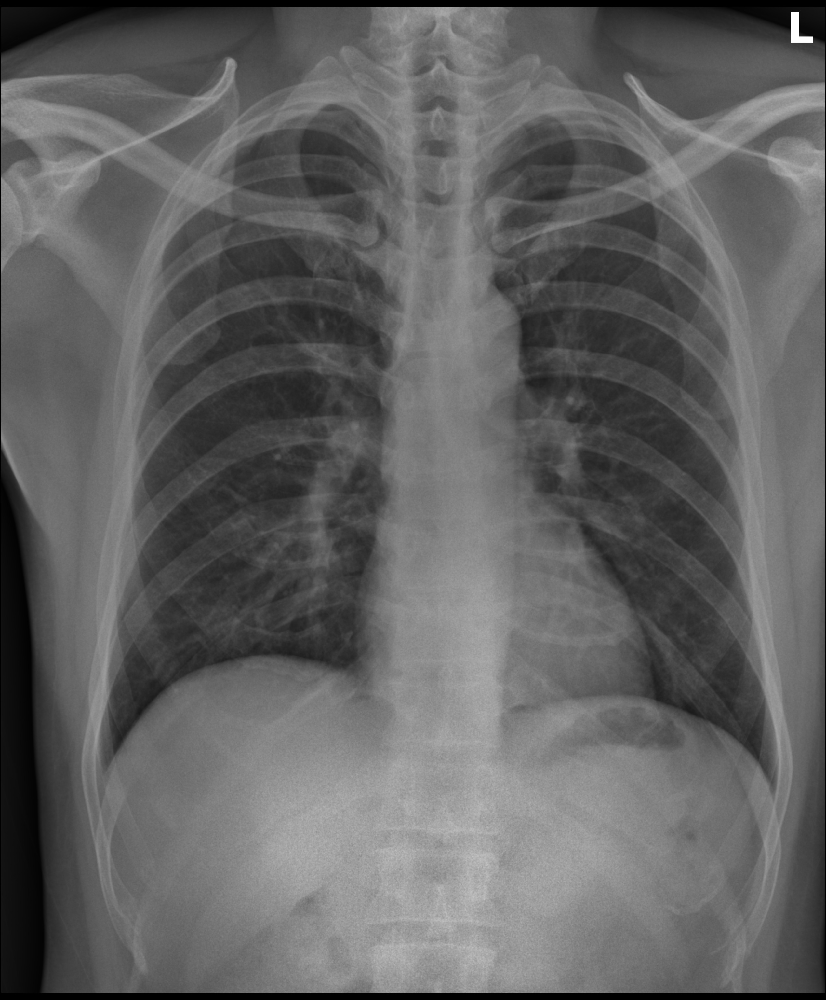

In [166]:
for image_path in normal[:3]:
    display.display(Image.open(str(image_path)))

In [167]:
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

In [168]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
# Mobile Net
IMG_HEIGHT = 224
IMG_WIDTH = 224
# IMG_HEIGHT = 299
# IMG_WIDTH = 299
STEPS_PER_EPOCH = np.ceil(image_count/BATCH_SIZE)

In [169]:
list_ds = tf.data.Dataset.list_files(str(data_dir/'*/*.jpg'))

In [170]:
for f in list_ds.take(5):
    print(f.numpy())

b'Dataset\\DDC Prison BLM TUA\\N\\001691430.jpg'
b'Dataset\\DDC Prison BLM TUA\\N\\001608752.jpg'
b'Dataset\\DDC Prison BLM TUA\\N\\001016658.jpg'
b'Dataset\\DDC Prison BLM TUA\\N\\001665529.jpg'
b'Dataset\\DDC Prison BLM TUA\\N\\001498554.jpg'


In [171]:
CLASS_NAMES

array(['AB', 'N'], dtype='<U2')

In [172]:
def get_label(file_path):
  # convert the path to a list of path components
    parts = tf.strings.split(file_path, os.path.sep)
  # The second to last is the class-directory
    return parts[-2] == CLASS_NAMES

In [173]:
def decode_img(img):
  # convert the compressed string to a 3D uint8 tensor
  img = tf.image.decode_jpeg(img, channels=3)
  # Use `convert_image_dtype` to convert to floats in the [0,1] range.
  img = tf.image.convert_image_dtype(img, tf.float32)
  # img = tf.cast(img, tf.float32)
  # resize the image to the desired size.
  return tf.image.resize(img, [IMG_WIDTH, IMG_HEIGHT])

In [174]:
def process_path(file_path):
    label = get_label(file_path)
    # load the raw data from the file as a string
    img = tf.io.read_file(file_path)
    img = decode_img(img)
    return img, label

In [175]:
# Set `num_parallel_calls` so multiple images are loaded/processed in parallel.
labeled_ds = list_ds.map(process_path, num_parallel_calls=AUTOTUNE)

In [176]:
for image, label in labeled_ds.take(2):
    print("Image shape: ", image.numpy().shape)
    print("Label: ", label.numpy())

Image shape:  (224, 224, 3)
Label:  [False  True]
Image shape:  (224, 224, 3)
Label:  [False  True]


In [177]:
def prepare_for_training(ds, cache=True, shuffle_buffer_size=1000):
  # This is a small dataset, only load it once, and keep it in memory.
  # use `.cache(filename)` to cache preprocessing work for datasets that don't
  # fit in memory.
    if cache:
        if isinstance(cache, str):
              ds = ds.cache(cache)
        else:
              ds = ds.cache()

        ds = ds.shuffle(buffer_size=shuffle_buffer_size)

        # Repeat forever
    ds = ds.repeat()

    ds = ds.batch(BATCH_SIZE)

  # `prefetch` lets the dataset fetch batches in the background while the model
  # is training.
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

In [178]:
train_ds = prepare_for_training(labeled_ds)

In [179]:
train_size = int(0.85 * image_count)
validation_size = int(0.15 * image_count)

train_dataset = train_ds.take(train_size)
validation_dataset = train_ds.skip(train_size)

In [180]:
def show_batch(image_batch, label_batch):
    plt.figure(figsize=(10,10))
    for n in range(BATCH_SIZE):
        ax = plt.subplot(6,6,n+1)
        plt.imshow(image_batch[n])
        plt.title(CLASS_NAMES[label_batch[n]==1][0].title())
        plt.axis('off')

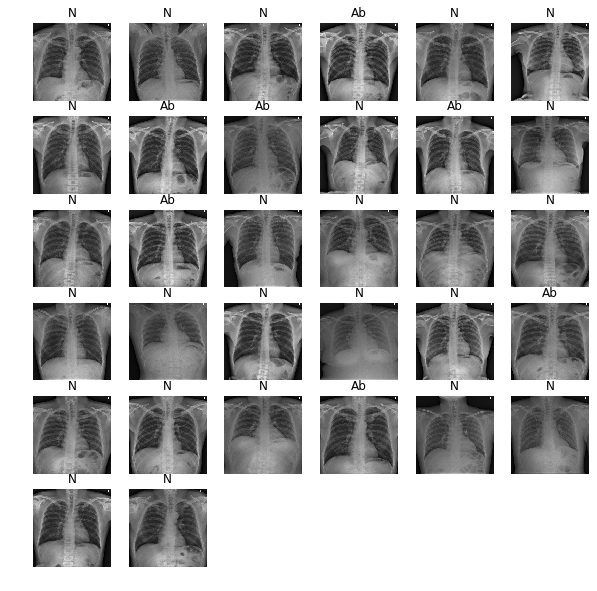

In [181]:
train_image_batch, train_label_batch = next(iter(train_dataset))
show_batch(train_image_batch.numpy(), train_label_batch.numpy())

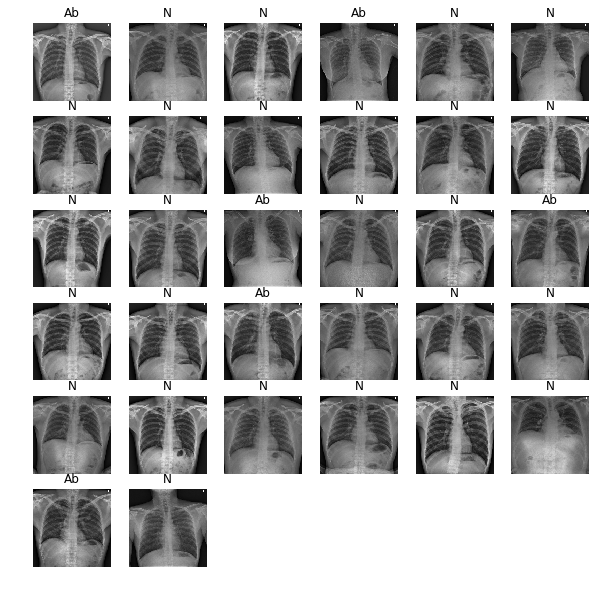

In [182]:
validation_image_batch, validation_label_batch = next(iter(validation_dataset))
show_batch(validation_image_batch.numpy(), validation_label_batch.numpy())

# Training

In [183]:
train_batches = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE)
validation_batches = validation_dataset

In [184]:
for image_batch, label_batch in train_batches.take(1):
   pass

image_batch.shape

TensorShape([32, 224, 224, 3])

In [185]:
IMG_SHAPE = (IMG_HEIGHT, IMG_WIDTH, 3)

# Create the base model from the pre-trained model MobileNet V2

base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')


# base_model = tf.keras.applications.inception_resnet_v2.InceptionResNetV2(
#                 include_top=True, 
#                 weights='imagenet', 
#                 input_shape=IMG_SHAPE, 
#                 pooling=None, 
#                 classes=1000)

In [186]:
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 7, 7, 1280)


In [187]:
base_model.trainable = False

In [188]:
base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 225, 225, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
_______________________________________________________________________________

In [189]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


In [190]:
#prediction_layer = tf.keras.layers.Dense(2,activation="softmax")
prediction_layer = tf.keras.layers.Dense(len(CLASS_NAMES),activation="softmax")

prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 2)


In [191]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  prediction_layer
])

In [192]:
base_learning_rate = 0.00001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
                loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
                #loss='categorical_crossentropy',
                #metrics=[tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])
                metrics=['accuracy'])

In [193]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Model) (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d_3 ( (None, 1280)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 2562      
Total params: 2,260,546
Trainable params: 2,562
Non-trainable params: 2,257,984
_________________________________________________________________


In [194]:
len(model.trainable_variables)

2

In [195]:
num_train = train_size
num_val = validation_size

In [196]:
num_train, num_val

(1814, 320)

In [197]:
initial_epochs = 30
steps_per_epoch = round(num_train)//BATCH_SIZE
validation_steps = round(num_val)//BATCH_SIZE

# loss0,accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

In [198]:
# print("initial loss: {:.2f}".format(loss0))
# print("initial accuracy: {:.2f}".format(accuracy0))

In [199]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
history = model.fit(train_batches,
                    epochs=initial_epochs,
                    steps_per_epoch=steps_per_epoch,
                    validation_data=validation_batches,
                    validation_steps=validation_steps)

Train for 56 steps, validate for 10 steps
Epoch 1/30
56/56 [==============================] - 173s 3s/step - loss: 0.7027 - accuracy: 0.6144 - val_loss: 0.7638 - val_accuracy: 0.2937
Epoch 2/30
56/56 [==============================] - 82s 1s/step - loss: 0.6673 - accuracy: 0.7600 - val_loss: 0.7313 - val_accuracy: 0.4656
Epoch 3/30
56/56 [==============================] - 81s 1s/step - loss: 0.6371 - accuracy: 0.8343 - val_loss: 0.6942 - val_accuracy: 0.7156
Epoch 4/30
56/56 [==============================] - 80s 1s/step - loss: 0.6185 - accuracy: 0.8622 - val_loss: 0.6714 - val_accuracy: 0.7875
Epoch 5/30
56/56 [==============================] - 80s 1s/step - loss: 0.6060 - accuracy: 0.8689 - val_loss: 0.6437 - val_accuracy: 0.8562
Epoch 6/30
56/56 [==============================] - 80s 1s/step - loss: 0.5955 - accuracy: 0.8778 - val_loss: 0.6367 - val_accuracy: 0.8719
Epoch 7/30
56/56 [==============================] - 80s 1s/step - loss: 0.5834 - accuracy: 0.8940 - val_loss: 0.6301 

# Adam

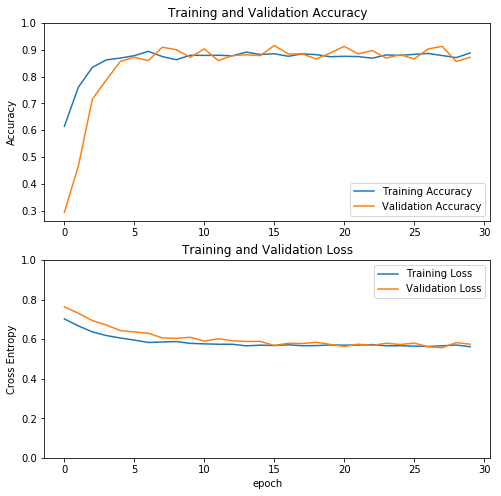

In [200]:
# recall = history.history['recall']
# val_recall = history.history['val_recall']

# precision = history.history['precision']
# val_precision = history.history['val_precision']


accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# plt.figure(figsize=(8, 8))
# plt.subplot(2, 1, 1)
# plt.plot(recall, label='Training Recall')
# plt.plot(val_recall, label='Validation Recall')
# plt.legend(loc='lower right')
# plt.ylabel('Recall')
# plt.ylim([min(plt.ylim()),1])
# plt.title('Training and Validation Recall')

# plt.figure(figsize=(8, 8))
# plt.subplot(2, 1, 1)
# plt.plot(precision, label='Training Precision')
# plt.plot(val_precision, label='Validation Precision')
# plt.legend(loc='lower right')
# plt.ylabel('Precision')
# plt.ylim([min(plt.ylim()),1])
# plt.title('Training and Validation Precision')



plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

# FINE TUNE

In [201]:
base_model.trainable = True

In [202]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine tune from this layer onwards
fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

Number of layers in the base model:  155


In [203]:
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
                #loss='categorical_crossentropy',
                #metrics=[tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])
                metrics=['accuracy'])

In [204]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Model) (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d_3 ( (None, 1280)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 2562      
Total params: 2,260,546
Trainable params: 1,865,154
Non-trainable params: 395,392
_________________________________________________________________


In [205]:
fine_tune_epochs = 10
total_epochs =  initial_epochs + fine_tune_epochs

# history_fine = model.fit(train_batches,
#                          epochs=total_epochs,
#                          initial_epoch =  history.epoch[-1],
#                          validation_data=validation_batches,
#                          validation_steps=validation_steps)

history_fine = model.fit(train_batches,
                    epochs=total_epochs,
                    initial_epoch =  history.epoch[-1],
                    steps_per_epoch=steps_per_epoch,
                    validation_data=validation_batches,
                    validation_steps=validation_steps)

Train for 56 steps, validate for 10 steps
Epoch 30/40
56/56 [==============================] - 152s 3s/step - loss: 0.5626 - accuracy: 0.8828 - val_loss: 0.5891 - val_accuracy: 0.8281
Epoch 31/40
56/56 [==============================] - 123s 2s/step - loss: 0.5607 - accuracy: 0.8850 - val_loss: 0.5704 - val_accuracy: 0.8656
Epoch 32/40
56/56 [==============================] - 126s 2s/step - loss: 0.5635 - accuracy: 0.8795 - val_loss: 0.5688 - val_accuracy: 0.8687
Epoch 33/40
56/56 [==============================] - 125s 2s/step - loss: 0.5610 - accuracy: 0.8845 - val_loss: 0.5532 - val_accuracy: 0.9000
Epoch 34/40
56/56 [==============================] - 128s 2s/step - loss: 0.5628 - accuracy: 0.8811 - val_loss: 0.5657 - val_accuracy: 0.8750
Epoch 35/40
56/56 [==============================] - 126s 2s/step - loss: 0.5695 - accuracy: 0.8677 - val_loss: 0.5688 - val_accuracy: 0.8687
Epoch 36/40
56/56 [==============================] - 126s 2s/step - loss: 0.5558 - accuracy: 0.8945 - val_

In [206]:
loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

# recall += history_fine.history['recall_1']
# val_recall += history_fine.history['val_recall_1']

# precision += history_fine.history['precision_1']
# val_precision += history_fine.history['val_precision_1']

accuracy += history_fine.history['accuracy']
val_accuracy += history_fine.history['val_accuracy']


In [207]:
# !mkdir -p saved_model
model.save('saved_model/ddc_prison_blm_2_category_tua_mobilenet.h5')

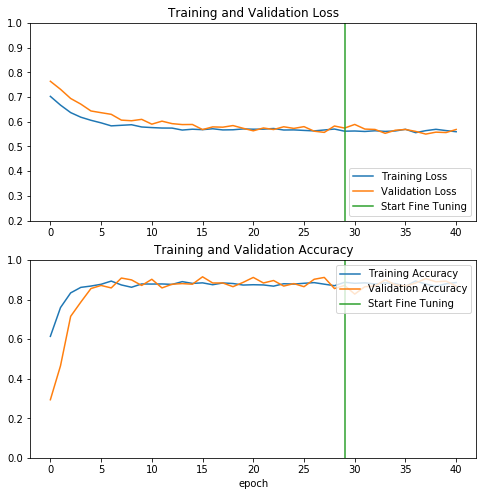

In [208]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0.2, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Loss')

# plt.subplot(2, 1, 2)
# plt.plot(recall, label='Training Recall')
# plt.plot(val_recall, label='Validation Recall')
# plt.ylim([0, 1.0])
# plt.plot([initial_epochs-1,initial_epochs-1],
#          plt.ylim(), label='Start Fine Tuning')
# plt.legend(loc='upper right')
# plt.title('Training and Validation Recall')
# plt.xlabel('epoch')
# plt.show()

# plt.subplot(2, 1, 2)
# plt.plot(precision, label='Training Precision')
# plt.plot(val_precision, label='Validation Precision')
# plt.ylim([0, 1.0])
# plt.plot([initial_epochs-1,initial_epochs-1],
#          plt.ylim(), label='Start Fine Tuning')
# plt.legend(loc='upper right')
# plt.title('Training and Validation Precision')
# plt.xlabel('epoch')
# plt.show()

plt.subplot(2, 1, 2)
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Accuracy')
plt.xlabel('epoch')
plt.show()